In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input/"))

# Any results you write to the current directory are saved as output.

['kuzushiji-centrenet', 'kuzushiji-recognition', 'kuzushiji-split-train', 'kuzushiji-mnist', 'kuzushiji-exploration']


In [2]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd
import random

In [3]:
input_filenames = os.listdir("../input/kuzushiji-recognition/train_images/")
box_list = pd.read_csv('../input/kuzushiji-recognition/train.csv')
box_list_dict = dict(zip(box_list['image_id'], box_list['labels']))
pred_filenames = os.listdir("../input/kuzushiji-recognition/test_images/")

In [4]:
def is_white_image(im_np_arr):
    if(np.mean(im_np_arr[:,:,0])==np.mean(im_np_arr[:,:,1])==np.mean(im_np_arr[:,:,2])):
        return True
    else:
        return False

In [5]:
# im_dir = '../input/kuzushiji-recognition/train_images/'
# num_white = 0
# white_dict = {}
# for nim,im in enumerate(input_filenames):
#     im_name = im.split('.jpg')[0]
#     im_name = Image.open(im_dir+im_name+'.jpg')
#     im_name = np.array(im_name)/255.
#     if(is_white_image(im_name)):
#         num_white += 1
#         white_dict[im] = 1
#     else:
#         white_dict[im] = 0
# print('Num white images: ',num_white)

In [6]:
# im_dir = '../input/kuzushiji-recognition/test_images/'
# num_white = 0
# for nim,im in enumerate(pred_filenames):
#     im_name = im.split('.jpg')[0]
#     im_name = Image.open(im_dir+im_name+'.jpg')
#     im_name = np.array(im_name)/255.
#     if(is_white_image(im_name)):
#         num_white += 1
#         white_dict[im] = 1
#     else:
#         white_dict[im] = 0
# print('Num white images: ',num_white)

In [7]:
import pickle
f = open('../input/kuzushiji-centrenet/white_dict.p','rb')
white_dict = pickle.load(f)
f.close()
f = open('white_dict.p','wb')
pickle.dump(white_dict,f)
f.close()

In [8]:
r_counter = 0
empty_files = []
for k,v in box_list_dict.items():
    if(not(isinstance(v, str))):
        if(k+'.jpg' in input_filenames):
            #input_filenames.remove(k+'.jpg')
            empty_files.append(k+'.jpg')
            r_counter += 1
print('Num input files removed: ',r_counter)

Num input files removed:  276


In [9]:
# train_list = []
# test_list = []
# for i in input_filenames:
#     if(i[:4]=='1002'):
#         test_list.append(i)
#     else:
#         train_list.append(i)

In [10]:
# #random.shuffle(input_filenames)
# train_list = input_filenames[:int(0.8*len(input_filenames))]
# test_list = input_filenames[int(0.8*len(input_filenames)):]

In [11]:
# for tl in range(len(train_list)):
#     if(white_dict[train_list[tl]]):
#         train_list.append(train_list[tl])

# for tl in range(len(test_list)):
#     if(white_dict[test_list[tl]]):
#         test_list.append(test_list[tl])

In [12]:
f = open('../input/kuzushiji-split-train/train_list.p','rb')
train_list = pickle.load(f)
f.close()
f = open('../input/kuzushiji-split-train/test_list.p','rb')
test_list = pickle.load(f)
f.close()

In [13]:
def area(au):
    return ((au[2] - au[0]) * (au[3] - au[1]))

def union(au, bu, area_intersection):
    area_a = (au[2] - au[0]) * (au[3] - au[1])
    area_b = (bu[2] - bu[0]) * (bu[3] - bu[1])
    area_union = area_a + area_b - area_intersection
    return area_union

def intersection(ai, bi):
    x = max(ai[0], bi[0])
    y = max(ai[1], bi[1])
    w = min(ai[2], bi[2]) - x
    h = min(ai[3], bi[3]) - y
    if w < 0 or h < 0:
        return 0
    return w*h

def iou(a, b):
    # a and b should be (x1,y1,x2,y2)
    if a[0] >= a[2] or a[1] >= a[3] or b[0] >= b[2] or b[1] >= b[3]:
        return 0.0

    area_i = intersection(a, b)
    area_u = union(a, b, area_i)
    iou =  float(area_i) / float(area_u + 1e-6)
    #print(iou,a,b,area_i,area_u)
    return iou

In [14]:
config_batch_size = 8
config_input_width = 512
config_input_height = 512
s2_input_width = 128
s2_input_height = 128
stride = 256
num_centres = 4
sub_start = 0
resize_setting = True
bw = False
if(bw):
    chn = 1
else:
    chn = 3

from skimage.transform import rescale, resize

def image_generator(mode=0,im_setting='partial',resize_im=False,gen_type='hmap',random_shuf=True):
    counter = 0
    if(mode==2):
        counter += sub_start
    if(mode==0):
        file_list = train_list[:]
        im_dir = '../input/kuzushiji-recognition/train_images/'
    elif(mode==1):
        file_list = test_list[:]
        im_dir = '../input/kuzushiji-recognition/train_images/'
    else:
        file_list = pred_filenames[:]
        im_dir = '../input/kuzushiji-recognition/test_images/'
    if(gen_type=='hmap'):
        last_dim = num_centres
    elif(gen_type=='mask'):
        last_dim = 1
    else:
        last_dim = num_centres + 1
    while True:
        if(random_shuf):
            random.shuffle(file_list)
        
        if(mode!=2):
            if counter+config_batch_size >= len(file_list):
                counter = 0
        
        im = file_list[counter]
        im_name = im.split('.jpg')[0]
        im = im.split('.jpg')[0]
        if(mode!=2):
            if(file_list[counter] in empty_files):
                labels = []
            else:
                labels = box_list_dict[im]
                labels = np.array(labels.split(' ')).reshape(-1, 5)
        if(bw):
            im = Image.open(im_dir+im+'.jpg').convert('LA')
            im = (np.array(im)[:,:,0])/255.
            im = np.expand_dims(im,axis=2)
        else:
            im = Image.open(im_dir+im+'.jpg')
            im = np.array(im)/255.
        
        
        if(im_setting=='partial'):
            batch_size_to_use = config_batch_size
        else:
            im_height = im.shape[0]
            im_width = im.shape[1]
            height_to_add = 0
            width_to_add = 0
            
            if(im_height%stride!=0):
                height_to_add = stride-(im_height%stride)
            if(im_width%stride!=0):
                width_to_add = stride-(im_width%stride)
            
            im = np.pad(im,((0,height_to_add),(0,width_to_add),(0,0)),mode='constant',constant_values=0)
            
            im_height = im.shape[0]
            im_width = im.shape[1]
            #print('Image padded shape',im.shape)
            batch_size_to_use = ((im_height//stride)-1)*((im_width//stride)-1)
        
        if(resize_im):
            text_images = np.zeros((batch_size_to_use, config_input_width//2, config_input_height//2, chn))
            box_images = np.zeros((batch_size_to_use, config_input_width//2, config_input_height//2,last_dim))
        else:
            text_images = np.zeros((batch_size_to_use, config_input_width, config_input_height, chn))
            box_images = np.zeros((batch_size_to_use, config_input_width, config_input_height,last_dim))
        
        start_x = 0
        start_y = 0
        
        for i in range(batch_size_to_use):
            if(im_setting=='partial'):
                rand_start_x = np.random.randint(im.shape[1]-config_input_width-1)
                rand_start_y = np.random.randint(im.shape[0]-config_input_height-1)
            else:
                rand_start_x = start_x
                rand_start_y = start_y
            if(resize_im):
                text_images[i] = resize(im[rand_start_y:rand_start_y+config_input_height,rand_start_x:rand_start_x+config_input_width,:],(config_input_height//2,config_input_width//2))
            else:
                text_images[i] = im[rand_start_y:rand_start_y+config_input_height,rand_start_x:rand_start_x+config_input_width,:]
            if(mode!=2):
                if(resize_im):
                    box_im = np.zeros([config_input_height//2,config_input_width//2,last_dim])
                else:
                    box_im = np.zeros([config_input_height,config_input_width,last_dim])

                for codepoint, x, y, w, h in labels:
                    x, y, w, h = int(x), int(y), int(w), int(h)
#                     if(resize_im):
#                         x = int(x/2)
#                         y = int(y/2)
#                         w = int(w/2)
#                         h = int(h/2)
                    left = x
                    left = left - rand_start_x
                    right = x+w
                    right = right - rand_start_x
                    top = y
                    top = top - rand_start_y
                    bottom = y+h
                    bottom = bottom - rand_start_y
                    left = max(0,min(config_input_width,left))
                    right = max(0,min(config_input_width,right))
                    top = max(0,min(config_input_height,top))
                    bottom = max(0,min(config_input_height,bottom))
                    
                    width = right - left
                    height = bottom - top

                    if(width*height<1):
                        #Bounding box is either outside or very insignificant
                        continue
                    
                    x_c = int((left+right)/2)
                    y_c = int((top+bottom)/2)
                    
                    if(resize_im):
                        x_c = int(x_c/2)
                        y_c = int(y_c/2)
                        width = int(width/2)
                        height = int(height/2)
                    
                    if(resize_im):
                        heatmap=((np.exp(-(((np.arange(config_input_width//2)-x_c)/((width/10)+1e-6))**2)/2)).reshape(1,-1)
                                *(np.exp(-(((np.arange(config_input_height//2)-y_c)/((height/10)+1e-6))**2)/2)).reshape(-1,1))
                    else:
                        heatmap=((np.exp(-(((np.arange(config_input_width)-x_c)/(width/10))**2)/2)).reshape(1,-1)
                                *(np.exp(-(((np.arange(config_input_height)-y_c)/(height/10))**2)/2)).reshape(-1,1))
                    
                    
                    
                    #print(heatmap.shape)
                    if(gen_type=='hmap'):
                        box_im[:,:,0] = np.maximum(box_im[:,:,0], heatmap)
                        if(resize_im):
                            box_im[y_c,x_c,1] = height/(config_input_height//2)
                            box_im[y_c,x_c,2] = width/(config_input_width//2)
                        else:
                            box_im[y_c,x_c,1] = height/config_input_height
                            box_im[y_c,x_c,2] = width/config_input_width
                        box_im[y_c,x_c,3] = 1.
                    elif(gen_type=='mask'):
                        box_im[int(y_c-height/2):int(y_c+height/2),int(x_c-width/2):int(x_c+width/2),0] = 1.
                    else:
                        box_im[:,:,0] = np.maximum(box_im[:,:,0], heatmap)
                        if(resize_im):
                            box_im[y_c,x_c,1] = height/(config_input_height//2)
                            box_im[y_c,x_c,2] = width/(config_input_width//2)
                        else:
                            box_im[y_c,x_c,1] = height/config_input_height
                            box_im[y_c,x_c,2] = width/config_input_width
                        box_im[y_c,x_c,3] = 1.
                        box_im[int(y_c-height/2):int(y_c+height/2),int(x_c-width/2):int(x_c+width/2),4] = 1.
                    
            if(im_setting=='full'):
                start_x += stride
                if(start_x>=im_width-stride-1):
                    start_x = 0
                    start_y += stride
                
            if(mode!=2):
                box_images[i,:,:,:] = box_im
        if(im_setting=='partial'):
            yield (text_images, box_images)
        else:
            yield (text_images, box_images,(im_height,im_width), im_name)
        if(mode!=2):
            counter += config_batch_size
        else:
            counter += 1

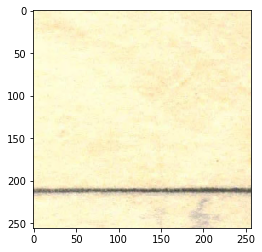

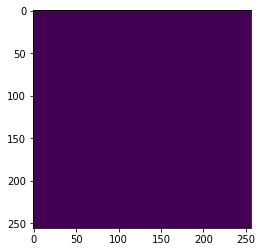

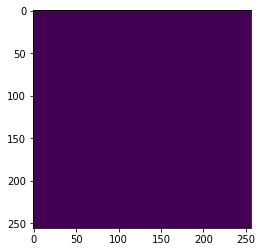

In [15]:
data_gen = image_generator(0,'partial',resize_setting,'both')
t_im, b_im  = next(data_gen)
if(bw):
    plt.imshow(t_im[0][:,:,0],cmap='gray')
else:
    plt.imshow(t_im[0])
plt.show()
plt.close()
plt.imshow(b_im[0][:,:,0])
plt.show()
plt.close()
plt.imshow(b_im[0][:,:,4])
plt.show()
plt.close()

In [16]:
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as K
import tensorflow as tf


def full_loss(y_true,y_pred):
    a1 = 2.
    a2 = 50.
    return ((a1*heatmap_loss(y_true,y_pred)) + (a2*size_loss(y_true,y_pred)))

def mask_loss(y_true,y_pred):
    truth = y_true[:,:,:,4]
    pred = y_pred[:,:,:,3]
    return K.mean(K.square(pred - truth), axis=-1)
    
def size_loss(y_true, y_pred):
    mask=K.sign(y_true[:,:,:,3])
    N=K.sum(mask) + 1
    alpha=2.
    beta=4.
    epsilon = K.epsilon()
    sizeloss= (K.sum(K.abs(mask*(y_true[:,:,:,1]-y_pred[:,:,:,1]))
                   +K.abs(mask*(y_true[:,:,:,2]-y_pred[:,:,:,2]))))/N
    return sizeloss

def heatmap_loss(y_true, y_pred):
    mask=K.sign(y_true[:,:,:,3])
    N=K.sum(mask) + 1
    alpha=2.
    beta=4.
    epsilon = K.epsilon()
    
    heatmap_true = y_true[:,:,:,0]
    heatmap_pred = K.clip(y_pred[:,:,:,0], epsilon, 1.-epsilon)
    
    term_1 = K.pow(1.- heatmap_pred,alpha)*K.log(heatmap_pred)
    term_2 = K.pow(1.- heatmap_true,beta)*(K.pow(heatmap_pred,alpha))*K.log(1-heatmap_pred)
    
    heatloss = (-K.sum(mask*term_1 + (1.-mask)*term_2))/N
    return heatloss

def conv_block(input_layer,nf):
    x1 = Conv2D(nf, 3, padding = 'same', kernel_initializer = 'he_normal')(input_layer)
    x1 = BatchNormalization()(x1)
    x1 = Activation('relu')(x1)
    return x1
    
def res_block(input_layer, nf):
    x1 = Conv2D(nf, 3, padding = 'same', kernel_initializer = 'he_normal')(input_layer)
    x1 = BatchNormalization()(x1)
    x1 = Activation('relu')(x1)
    x1 = Conv2D(nf, 3, padding = 'same', kernel_initializer = 'he_normal')(x1)
    x1 = BatchNormalization()(x1)
    x1 = Add()([input_layer,x1])
    x1 = Activation('relu')(x1)
    return x1

def res_unet():
    inputs = Input((config_input_width//2,config_input_height//2,chn))
    conv1 = conv_block(inputs,64) #512,512,64
    conv1 = res_block(conv1,64) 
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1) #256,256,64
    conv2 = conv_block(pool1,128)
    conv2 = res_block(conv2,128)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2) #128,128,128
    conv3 = conv_block(pool2,256)
    conv3 = res_block(conv3,256)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3) #64,64,256
    #pool3 = Dropout(0.2)(pool3)
    #conv4 = conv_block(pool3,512)
    #conv4 = res_block(conv4,512)
    #pool4 = MaxPooling2D(pool_size=(2, 2))(conv4) #32,32,512
    
    conv5 = conv_block(pool3,512)
    conv5 = res_block(conv5,512) # 32, 32, 1024

    #up6 = conv_block(UpSampling2D(size = (2,2))(conv5),512) # 64, 64, 512
    #merge6 = conv_block(concatenate([conv4,up6], axis = 3),512) # 64, 64, 1024
    #conv6 = res_block(merge6,512) # 64,64,512

    up7 = conv_block(UpSampling2D(size = (2,2))(conv5),256) # 128,128,256
    merge7 = conv_block(concatenate([conv3,up7], axis = 3),256) #128,128,512
    conv7 = res_block(merge7,256) #128,128,256
    
    up8 = conv_block(UpSampling2D(size = (2,2))(conv7),128) #256,256,128
    merge8 = conv_block(concatenate([conv2,up8], axis = 3),128) #256,256,256
    conv8 = res_block(merge8,128) #256,256,128

    up9 = conv_block(UpSampling2D(size = (2,2))(conv8),64)
    merge9 = conv_block(concatenate([conv1,up9], axis = 3),64)
    conv9 = res_block(merge9,64)
    
    mask_pred = Conv2D(1, 3, activation = 'sigmoid', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    centre_pred = Conv2D(3, 3, activation = 'sigmoid', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    
    return inputs, mask_pred, centre_pred

def unet():
    inputs = Input((config_input_width,config_input_height,chn))
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)
    drop4 = Dropout(0.05)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    conv5 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    drop5 = Dropout(0.05)(conv5)

    up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

    up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

    up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

    up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    conv10 = Conv2D(3, 3, activation = 'sigmoid', padding = 'same', kernel_initializer = 'he_normal')(conv9)
    model = Model(input = inputs, output = conv10)
    return model

Using TensorFlow backend.
/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/opt/conda/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarn

In [17]:
# input_tensor, mask_tensor, center_tensor  = res_unet()

In [18]:
#NOT NEEDED in new ARCH
#model.load_weights('../input/kuzushiji-exploration/nnet.h5')

In [19]:
#NOT NEEDED in new ARCH
# top_off = model.layers[-2].output
# centre_out = Conv2D(3, 3, activation = 'sigmoid', padding = 'same', kernel_initializer = 'he_normal')(top_off)

In [20]:
# model_mask = Model(input = input_tensor, output = mask_tensor)
# model_mask.compile(loss='mse', optimizer=Adam(lr=1e-4))

In [21]:
# data_generator = image_generator(0,'partial',resize_setting,'mask')
# val_generator = image_generator(1,'partial',resize_setting,'mask')
# history = model_mask.fit_generator(data_generator,
#                     steps_per_epoch=800,
#                     epochs=12,
#                     verbose=2,
#                     validation_data=val_generator,
#                     validation_steps = 200)
# #model.save('nnet.h5')

In [22]:
# val_generator = image_generator(1,'partial',resize_setting,'mask')
# t_im, b_im = next(val_generator)
# p_im = model_mask.predict(t_im)
# if(bw):
#     plt.imshow(t_im[0][:,:,0],cmap='gray')
# else:
#     plt.imshow(t_im[0])
# plt.show()
# plt.close()
# plt.imshow(b_im[0][:,:,0])
# plt.show()
# plt.close()
# plt.imshow(p_im[0][:,:,0])
# plt.show()
# plt.close()

In [23]:
# model_centre = Model(input = input_tensor, output = center_tensor)
# model_centre.compile(loss=full_loss, optimizer=Adam(lr=1e-4), metrics=[heatmap_loss,size_loss])

In [24]:
from keras.models import load_model
model_centre = load_model("../input/kuzushiji-centrenet/nnet.h5",
                  compile=False)
model_centre.compile(loss=full_loss, optimizer=Adam(lr=1e-4), metrics=[heatmap_loss,size_loss])

In [25]:
data_generator = image_generator(0,'partial',resize_setting,'hmap')
val_generator = image_generator(1,'partial',resize_setting,'hmap')
history = model_centre.fit_generator(data_generator,
                    steps_per_epoch=800,
                    epochs=37,
                    verbose=2,
                    validation_data=val_generator,
                    validation_steps = 200)


Epoch 1/37
 - 679s - loss: 2.7062 - heatmap_loss: 0.8273 - size_loss: 0.0210 - val_loss: 4.0247 - val_heatmap_loss: 1.4458 - val_size_loss: 0.0227
Epoch 2/37
 - 642s - loss: 2.8239 - heatmap_loss: 0.8741 - size_loss: 0.0215 - val_loss: 4.1073 - val_heatmap_loss: 1.4410 - val_size_loss: 0.0245
Epoch 3/37
 - 639s - loss: 2.5896 - heatmap_loss: 0.8110 - size_loss: 0.0194 - val_loss: 4.3500 - val_heatmap_loss: 1.5236 - val_size_loss: 0.0261
Epoch 4/37
 - 640s - loss: 2.5070 - heatmap_loss: 0.7736 - size_loss: 0.0192 - val_loss: 3.2693 - val_heatmap_loss: 1.1840 - val_size_loss: 0.0180
Epoch 5/37
 - 640s - loss: 2.6644 - heatmap_loss: 0.8280 - size_loss: 0.0202 - val_loss: 4.2718 - val_heatmap_loss: 1.5907 - val_size_loss: 0.0218
Epoch 6/37
 - 652s - loss: 2.8627 - heatmap_loss: 0.9158 - size_loss: 0.0206 - val_loss: 3.9391 - val_heatmap_loss: 1.2863 - val_size_loss: 0.0273
Epoch 7/37
 - 655s - loss: 2.3449 - heatmap_loss: 0.7204 - size_loss: 0.0181 - val_loss: 3.6455 - val_heatmap_loss: 1.

In [26]:
model_centre.save('nnet.h5')

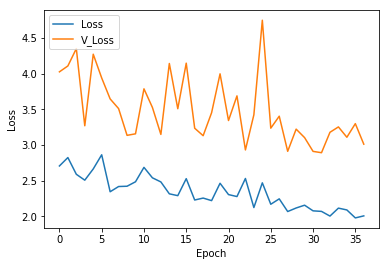

In [27]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Loss', 'V_Loss'], loc='upper left')
plt.show()

In [28]:
class predict_to_box:
    def __init__(self,predict_threshold,iou_threshold):
        self.predict_threshold = predict_threshold
        self.iou_threshold = iou_threshold
    
    def return_rects(self,predict_array):
        # Return all rectangles where peak point is > prediction threshold
        # Predict array is of shape (im_height, im_width, 3)
        # The last axis is as: 
        # 0 - Prediction score
        # 1 - Predicted normalized height
        # 2 - Predicted normalized width
        
        boxes = []
        
        peaks = np.where(predict_array[:,:,0]>=self.predict_threshold)
        peaks = np.array(peaks).T # (x,y) coordinates of all peak points
        
        for j in range(peaks.shape[0]):
            x_ind = peaks[j,0]
            y_ind = peaks[j,1]
            pscore, ph, pw = predict_array[x_ind,y_ind,:3]
            if(resize_setting):
                ph = int(ph*(config_input_height//2))
                pw = int(pw*(config_input_width//2))
            else:
                ph = int(ph*config_input_height)
                pw = int(pw*config_input_width)
            x_left = int(x_ind-(ph)/2)
            y_top = int(y_ind-(pw)/2)
            
            #TODO Improvement possible here
            x_left = max(0,min(config_input_height,x_left))
            y_top = max(0,min(config_input_width,y_top))
            
            boxes.append((x_left,y_top,pw,ph,pscore))
        
        return boxes
    
    def nms_algo(self,all_boxes,stage=1):
        if len(all_boxes)==0:
            return all_boxes
        else:
            box_valid = [1 for i in all_boxes]
            box_prob = [i[-1] for i in all_boxes]
            box_index = [ni for ni,i in enumerate(all_boxes)]
            box_prob, box_index = (list(t) for t in zip(*sorted(zip(box_prob, box_index))))
            for nbi,bi in enumerate(box_index):
                if(box_valid[bi]==0):
                    continue
                a1,a2,a3,a4 = all_boxes[bi][:4]
                for sbi in (box_index[nbi+1:]):
                    if(box_valid[sbi]==0):
                        continue
                    b1,b2,b3,b4 = all_boxes[sbi][:4]
                    iou_bi_sbi = iou((a1,a2,a1+a4,a2+a3),(b1,b2,b1+b4,b2+b3))
                    area_1 = area((a1,a2,a1+a4,a2+a3))
                    area_2 = area((b1,b2,b1+b4,b2+b3))
                    int_12 = intersection((a1,a2,a1+a4,a2+a3),(b1,b2,b1+b4,b2+b3))
                    if(stage==1):
                        if(iou_bi_sbi>self.iou_threshold):
                            box_valid[sbi] = 0
                    else:
                        if((int_12/area_2)>0.5):
                            box_valid[sbi] = 0
                        if((int_12/area_1)>0.5):
                            box_valid[sbi] = 0
                        
            nms_boxes = [i for ni,i in enumerate(all_boxes) if box_valid[ni]]
            return nms_boxes
    
    def return_nms_rects(self, predict_array):
        # Return rectangles after NMS suppresion
        all_boxes = self.return_rects(predict_array)
        nms_boxes = self.nms_algo(all_boxes)
        return nms_boxes

8 8


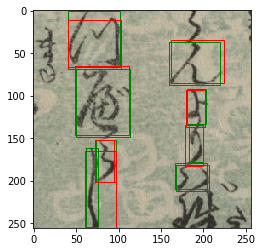

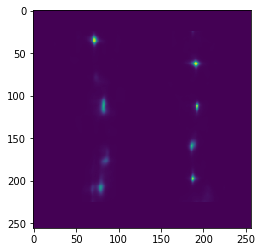

3 3


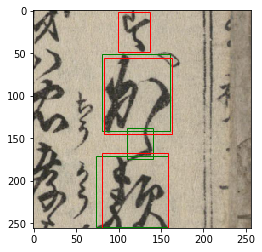

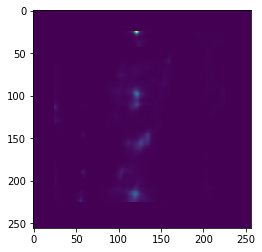

8 8


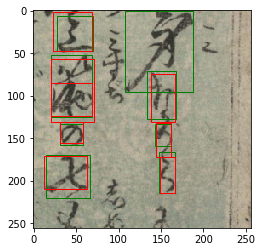

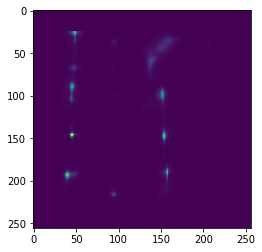

8 9


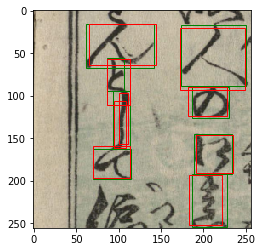

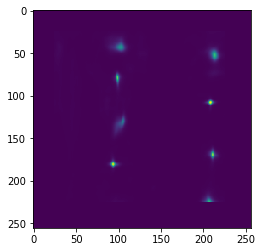

5 5


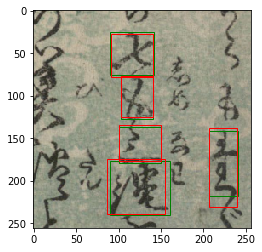

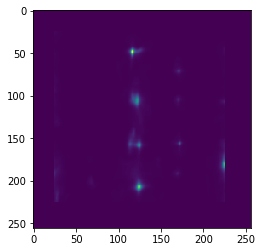

4 4


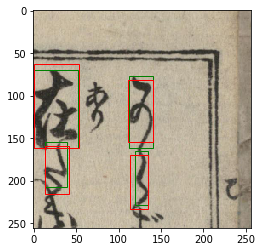

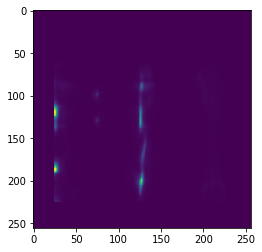

6 6


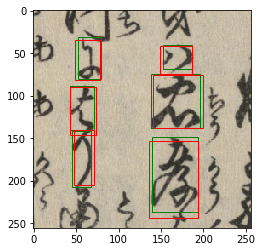

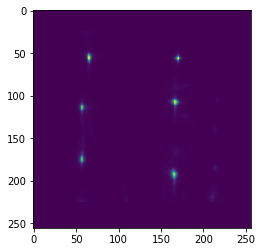

4 4


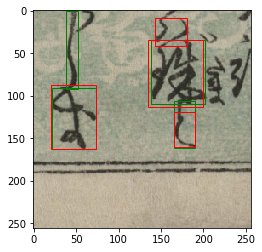

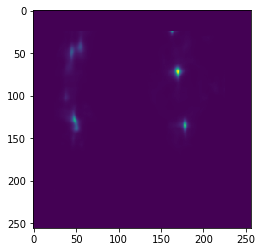

In [29]:
val_generator = image_generator(1,'partial',resize_setting,'hmap')
t_im, b_im = next(val_generator)
p_im = model_centre.predict(t_im)

for i in range(config_batch_size):
    fig,ax = plt.subplots(1)
    if(bw):
        ax.imshow(t_im[i][:,:,0],cmap='gray')
    else:
        ax.imshow(t_im[i])
    p_to_b = predict_to_box(1.0,0.5)
    if(resize_setting):
        b_im[i,:25,:,0] = 0.
        b_im[i,:,:25,0] = 0.
        b_im[i,225:,:,0] = 0.
        b_im[i,:,225:,0] = 0.
    else:
        b_im[i,:50,:,0] = 0.
        b_im[i,:,:50,0] = 0.
        b_im[i,450:,:,0] = 0.
        b_im[i,:,450:,0] = 0.
    nms_rects = p_to_b.return_nms_rects(b_im[i])
    for j in range(len(nms_rects)):
        x_left,y_top,pw,ph = nms_rects[j][:4]
        rect = patches.Rectangle((int(y_top),int(x_left)),pw,ph,linewidth=1,edgecolor='g',facecolor='none')
        ax.add_patch(rect)
    num_true = len(nms_rects)
    p_to_b = predict_to_box(0.2,0.5)
    if(resize_setting):
        p_im[i,:25,:,0] = 0.
        p_im[i,:,:25,0] = 0.
        p_im[i,225:,:,0] = 0.
        p_im[i,:,225:,0] = 0.
    else:
        p_im[i,:50,:,0] = 0.
        p_im[i,:,:50,0] = 0.
        p_im[i,450:,:,0] = 0.
        p_im[i,:,450:,0] = 0.
    nms_rects = p_to_b.return_nms_rects(p_im[i])
    for j in range(len(nms_rects)):
        x_left,y_top,pw,ph = nms_rects[j][:4]
        rect = patches.Rectangle((int(y_top),int(x_left)),pw,ph,linewidth=1,edgecolor='r',facecolor='none')
        ax.add_patch(rect)
    num_pred = len(nms_rects)
    print(num_true,num_pred)
    plt.show()
    plt.close()
    plt.imshow(p_im[i,:,:,0])
    plt.show()
    plt.close()

In [30]:
import pickle
f = open('../input/kuzushiji-mnist/char_dict.p','rb')
char_dict = pickle.load(f)
f.close()
f = open('../input/kuzushiji-mnist/inv_char_dict.p','rb')
inv_char_dict = pickle.load(f)
f.close()
class_num = len(char_dict.keys())

In [31]:
from keras.applications.resnet50 import ResNet50
model = ResNet50(include_top=True,
             weights=None,
             input_shape=(s2_input_height,s2_input_width,1),
             pooling=None,
             classes=class_num)
model.load_weights("../input/kuzushiji-mnist/nnet.h5")

In [32]:
def sanity_check(im_name, loc_string, check_type):
    if(check_type=='sub'):
        rs_size = 3
        im_dir = '../input/kuzushiji-recognition/test_images/'
    else:
        rs_size = 5
        im_dir = '../input/kuzushiji-recognition/train_images/'
    
    im = Image.open(im_dir+im_name+'.jpg')
    im = np.array(im)/255.
    loc_string = np.array(loc_string.split(' ')).reshape(-1, rs_size)
    plt.figure(figsize=(30,20))
    plt.imshow(im)
    
    for ls in loc_string:
        if(rs_size==3):
            codepoint, x, y = ls
            x, y = int(x),int(y)
            x_c = x
            y_c = y
        else:
            codepoint, x, y, w, h = ls
            x, y, w, h = int(x),int(y),int(w),int(h)
            x_c = int(x+(w/2))
            y_c = int(y+(h/2))
        plt.scatter(x=[x_c], y=[y_c], c='r', s=10)
    plt.show()
    plt.close()
    return

In [33]:
def score_page_location_only(preds, truth):
    """
    Scores a single page.
    Args:
        preds: prediction string of labels and center points.
        truth: ground truth string of labels and bounding boxes.
    Returns:
        True/false positive and false negative counts for the page
    """
    tp = 0
    fp = 0
    fn = 0
    
    if(len(preds)==0):
        return {'tp': tp, 'fp': fp, 'fn': fn}
    
    truth_indices = {
        'label': 0,
        'X': 1,
        'Y': 2,
        'Width': 3,
        'Height': 4
    }
    preds_indices = {
        'label': 0,
        'X': 1,
        'Y': 2
    }

    if pd.isna(truth) and pd.isna(preds):
        return {'tp': tp, 'fp': fp, 'fn': fn}

    if pd.isna(truth):
        fp += len(preds.split(' ')) // len(preds_indices)
        return {'tp': tp, 'fp': fp, 'fn': fn}

    if pd.isna(preds):
        fn += len(truth.split(' ')) // len(truth_indices)
        return {'tp': tp, 'fp': fp, 'fn': fn}

    truth = truth.split(' ')
    if len(truth) % len(truth_indices) != 0:
        raise ValueError('Malformed solution string')
    truth_label = np.array(truth[truth_indices['label']::len(truth_indices)])
    truth_xmin = np.array(truth[truth_indices['X']::len(truth_indices)]).astype(float)
    truth_ymin = np.array(truth[truth_indices['Y']::len(truth_indices)]).astype(float)
    truth_xmax = truth_xmin + np.array(truth[truth_indices['Width']::len(truth_indices)]).astype(float)
    truth_ymax = truth_ymin + np.array(truth[truth_indices['Height']::len(truth_indices)]).astype(float)

    preds = preds.split(' ')
    if len(preds) % len(preds_indices) != 0:
        raise ValueError('Malformed prediction string')
    preds_label = np.array(preds[preds_indices['label']::len(preds_indices)])
    preds_x = np.array(preds[preds_indices['X']::len(preds_indices)]).astype(float)
    preds_y = np.array(preds[preds_indices['Y']::len(preds_indices)]).astype(float)
    preds_unused = np.ones(len(preds_label)).astype(bool)

    for xmin, xmax, ymin, ymax, label in zip(truth_xmin, truth_xmax, truth_ymin, truth_ymax, truth_label):
        # Matching = point inside box & character same & prediction not already used
        matching = (xmin < preds_x) & (xmax > preds_x) & (ymin < preds_y) & (ymax > preds_y) & preds_unused
        if matching.sum() == 0:
            fn += 1
        else:
            tp += 1
            preds_unused[np.argmax(matching)] = False
    fp += preds_unused.sum()
    return {'tp': tp, 'fp': fp, 'fn': fn}

In [34]:
def score_page(preds, truth):
    """
    Scores a single page.
    Args:
        preds: prediction string of labels and center points.
        truth: ground truth string of labels and bounding boxes.
    Returns:
        True/false positive and false negative counts for the page
    """
    tp = 0
    fp = 0
    fn = 0
    
    if(len(preds)==0):
        return {'tp': tp, 'fp': fp, 'fn': fn}
    
    truth_indices = {
        'label': 0,
        'X': 1,
        'Y': 2,
        'Width': 3,
        'Height': 4
    }
    preds_indices = {
        'label': 0,
        'X': 1,
        'Y': 2
    }

    if pd.isna(truth) and pd.isna(preds):
        return {'tp': tp, 'fp': fp, 'fn': fn}

    if pd.isna(truth):
        fp += len(preds.split(' ')) // len(preds_indices)
        return {'tp': tp, 'fp': fp, 'fn': fn}

    if pd.isna(preds):
        fn += len(truth.split(' ')) // len(truth_indices)
        return {'tp': tp, 'fp': fp, 'fn': fn}

    truth = truth.split(' ')
    if len(truth) % len(truth_indices) != 0:
        raise ValueError('Malformed solution string')
    truth_label = np.array(truth[truth_indices['label']::len(truth_indices)])
    truth_xmin = np.array(truth[truth_indices['X']::len(truth_indices)]).astype(float)
    truth_ymin = np.array(truth[truth_indices['Y']::len(truth_indices)]).astype(float)
    truth_xmax = truth_xmin + np.array(truth[truth_indices['Width']::len(truth_indices)]).astype(float)
    truth_ymax = truth_ymin + np.array(truth[truth_indices['Height']::len(truth_indices)]).astype(float)

    preds = preds.split(' ')
    if len(preds) % len(preds_indices) != 0:
        raise ValueError('Malformed prediction string')
    preds_label = np.array(preds[preds_indices['label']::len(preds_indices)])
    preds_x = np.array(preds[preds_indices['X']::len(preds_indices)]).astype(float)
    preds_y = np.array(preds[preds_indices['Y']::len(preds_indices)]).astype(float)
    preds_unused = np.ones(len(preds_label)).astype(bool)

    for xmin, xmax, ymin, ymax, label in zip(truth_xmin, truth_xmax, truth_ymin, truth_ymax, truth_label):
        # Matching = point inside box & character same & prediction not already used
        matching = (xmin < preds_x) & (xmax > preds_x) & (ymin < preds_y) & (ymax > preds_y) & (preds_label == label) & preds_unused
        if matching.sum() == 0:
            fn += 1
        else:
            tp += 1
            preds_unused[np.argmax(matching)] = False
    fp += preds_unused.sum()
    return {'tp': tp, 'fp': fp, 'fn': fn}

In [35]:
def compute_mean_f1(sstrs,tstrs):
    
    results = [score_page(sstrs[ni],tstrs[ni]) for ni in range(len(sstrs))]
    
    tp = sum([x['tp'] for x in results])
    fp = sum([x['fp'] for x in results])
    fn = sum([x['fn'] for x in results])
    
    print("TP: {}, FP: {}, FN: {}".format(str(tp),str(fp),str(fn)))
    
    if (tp + fp) == 0 or (tp + fn) == 0:
        return 0
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    if precision > 0 and recall > 0:
        f1 = (2 * precision * recall) / (precision + recall)
    else:
        f1 = 0
    return f1

In [36]:
def compute_mean_f1_location_only(sstrs,tstrs):
    
    results = [score_page_location_only(sstrs[ni],tstrs[ni]) for ni in range(len(sstrs))]
    
    tp = sum([x['tp'] for x in results])
    fp = sum([x['fp'] for x in results])
    fn = sum([x['fn'] for x in results])
    
    print("TP: {}, FP: {}, FN: {}".format(str(tp),str(fp),str(fn)))
    
    if (tp + fp) == 0 or (tp + fn) == 0:
        return 0
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    if precision > 0 and recall > 0:
        f1 = (2 * precision * recall) / (precision + recall)
    else:
        f1 = 0
    return f1

In [37]:
def preprocess(patch_im):
    patch_im_bw = np.array(np.dot(patch_im[...,:3], [0.299, 0.587, 0.114]),dtype=np.uint8)
    patch_im_bw = np.invert(patch_im_bw)
    thresh = 255*0.5
    patch_im_bw[patch_im_bw<thresh] = 0
    patch_im_bw[patch_im_bw>=thresh] = 255
    padded_im = np.zeros([s2_input_height,s2_input_width])
    s0,s1 = patch_im_bw.shape
    if(s0==s2_input_height or s1==s2_input_width):
        return patch_im_bw
    else:
        st_x = np.random.randint(0,s2_input_height-s0+1)
        st_y = np.random.randint(0,s2_input_width-s1+1)
        padded_im[st_x:st_x+s0,st_y:st_y+s1] = patch_im_bw
    return padded_im

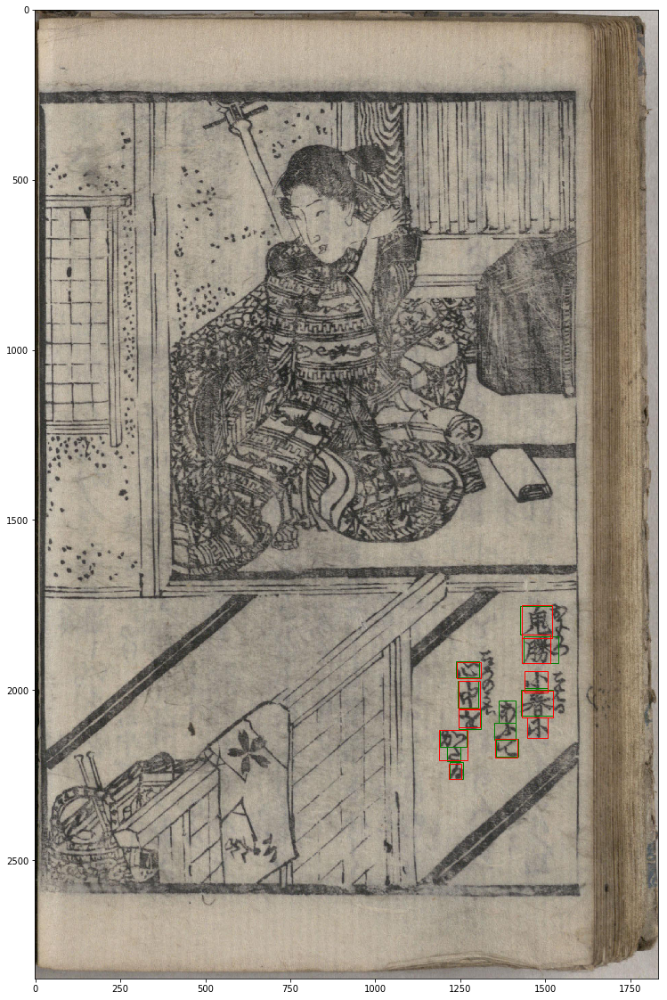

Full F1:  {'tp': 10, 'fp': 1, 'fn': 4} 0
Location only:  {'tp': 11, 'fp': 0, 'fn': 3}


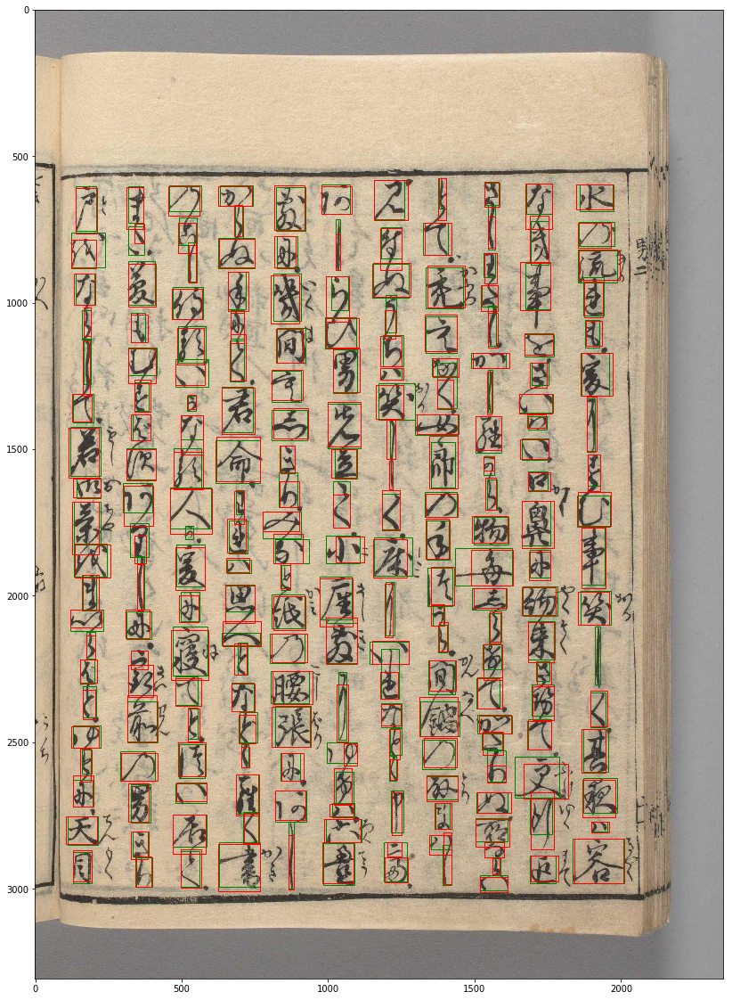

Full F1:  {'tp': 192, 'fp': 20, 'fn': 18} 1
Location only:  {'tp': 208, 'fp': 4, 'fn': 2}


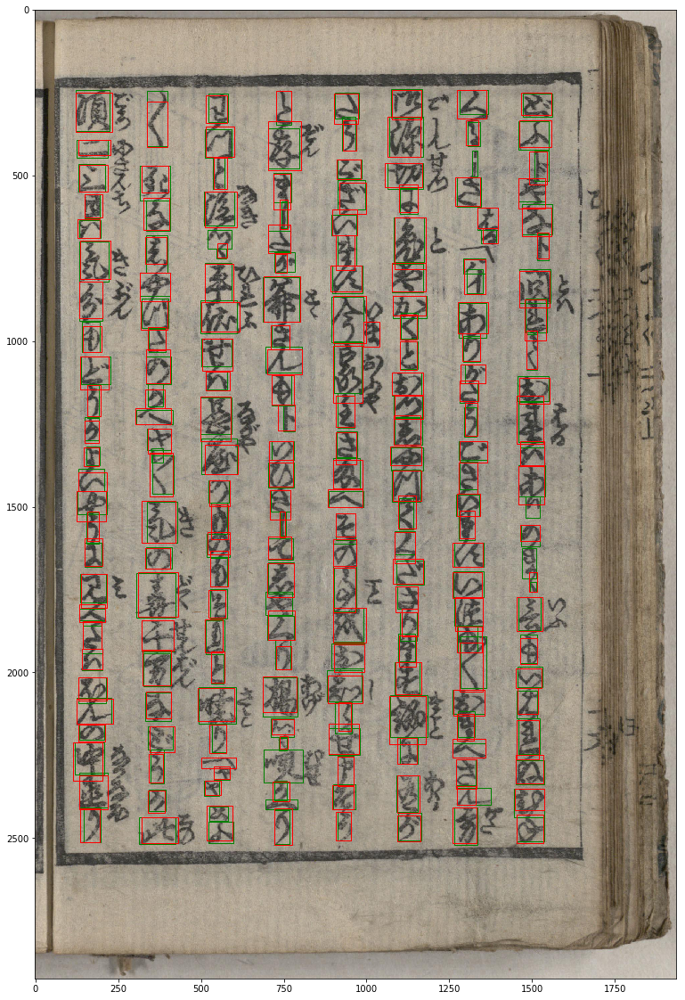

Full F1:  {'tp': 178, 'fp': 17, 'fn': 25} 2
Location only:  {'tp': 192, 'fp': 3, 'fn': 11}


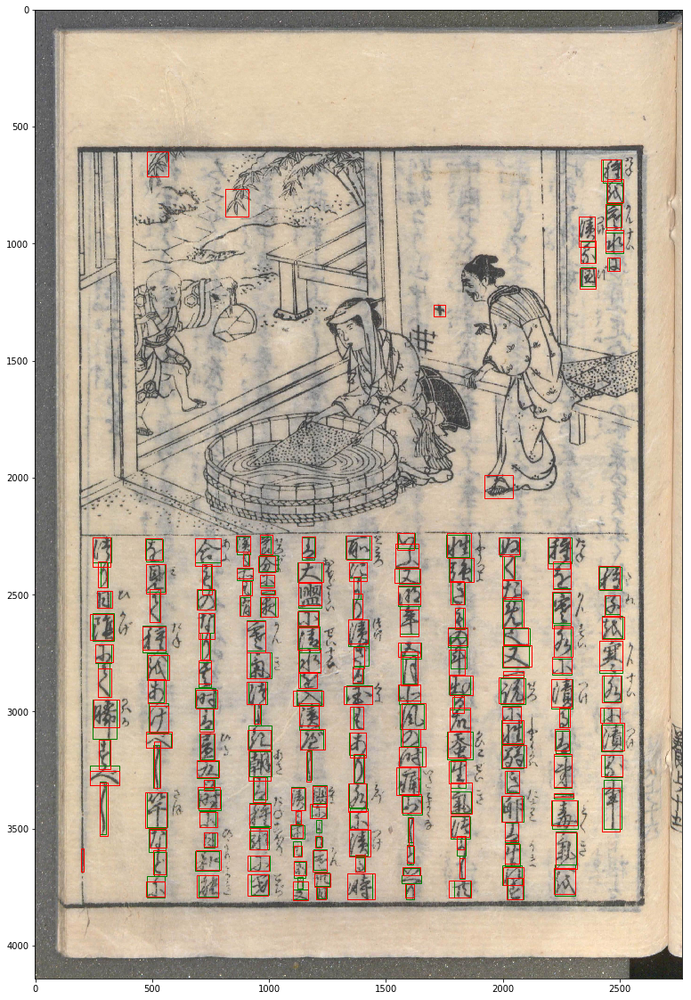

Full F1:  {'tp': 169, 'fp': 15, 'fn': 13} 3
Location only:  {'tp': 179, 'fp': 5, 'fn': 3}


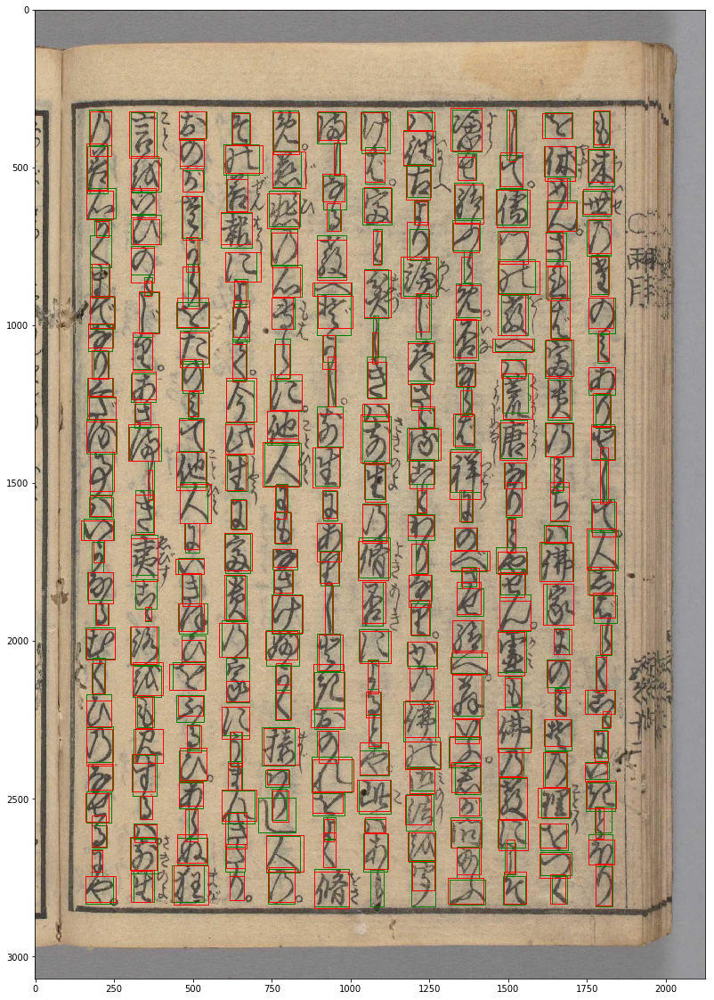

Full F1:  {'tp': 279, 'fp': 12, 'fn': 16} 4
Location only:  {'tp': 291, 'fp': 0, 'fn': 4}


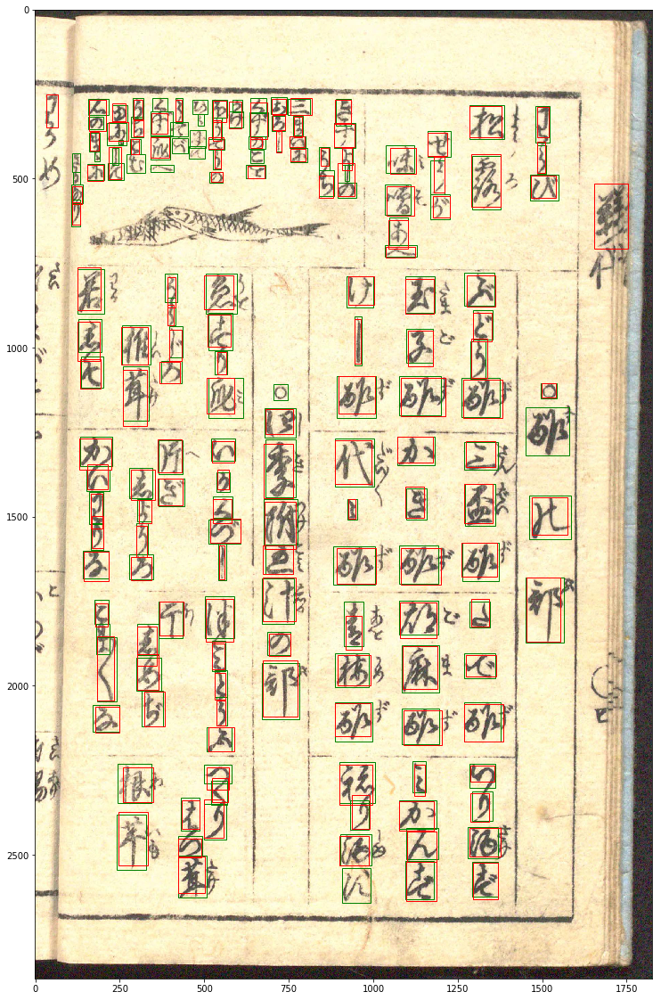

Full F1:  {'tp': 122, 'fp': 26, 'fn': 47} 5
Location only:  {'tp': 145, 'fp': 3, 'fn': 24}


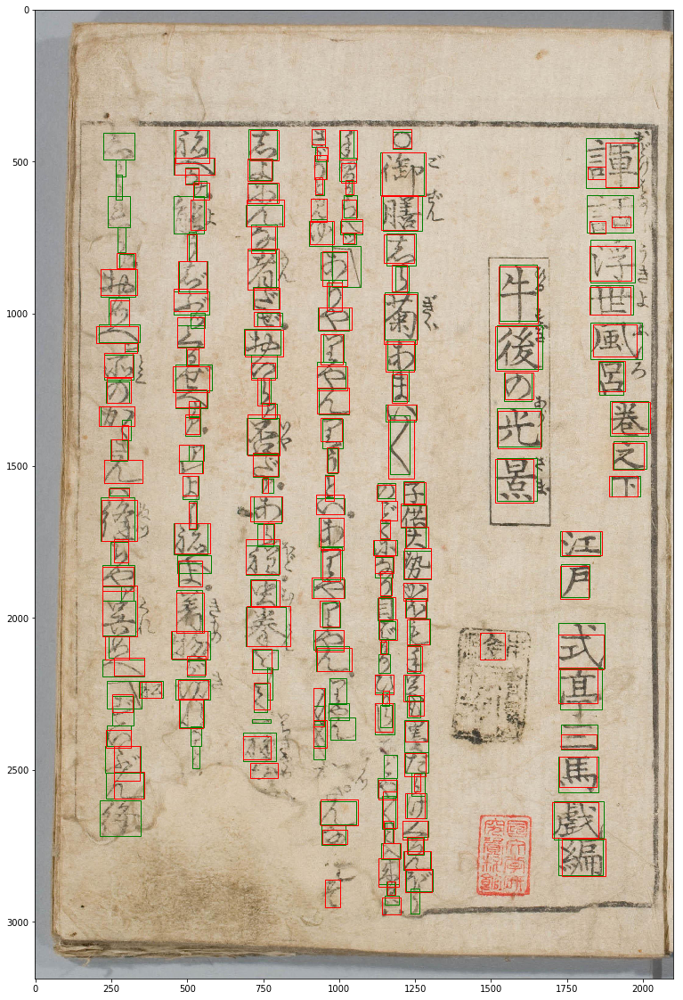

Full F1:  {'tp': 140, 'fp': 36, 'fn': 54} 6
Location only:  {'tp': 169, 'fp': 7, 'fn': 25}


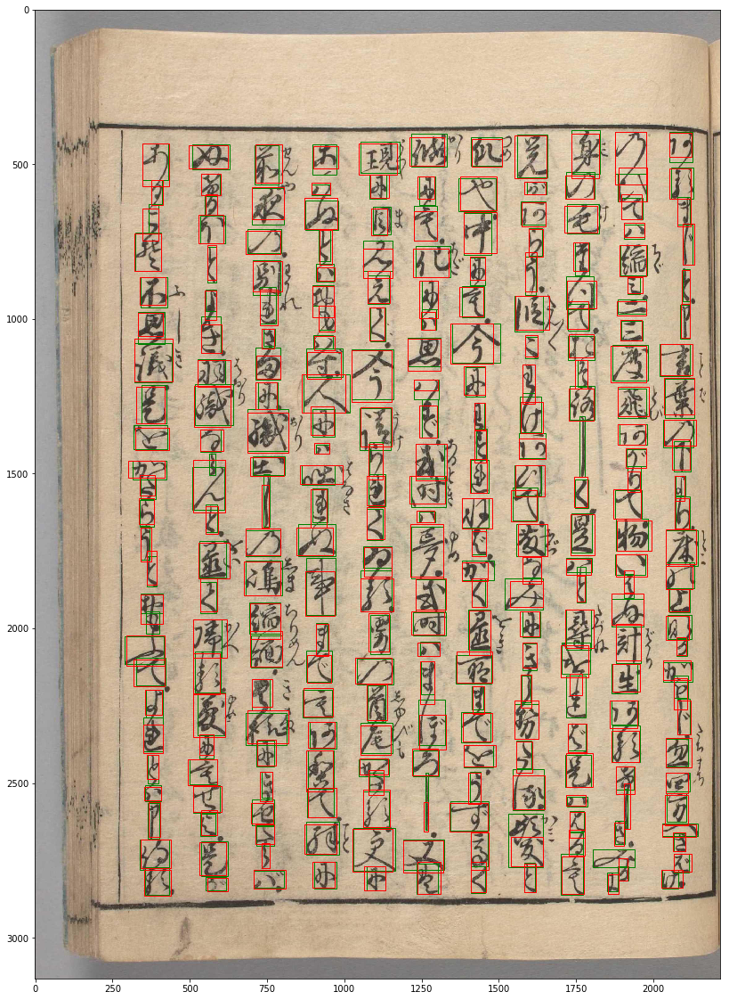

Full F1:  {'tp': 249, 'fp': 11, 'fn': 15} 7
Location only:  {'tp': 260, 'fp': 0, 'fn': 4}


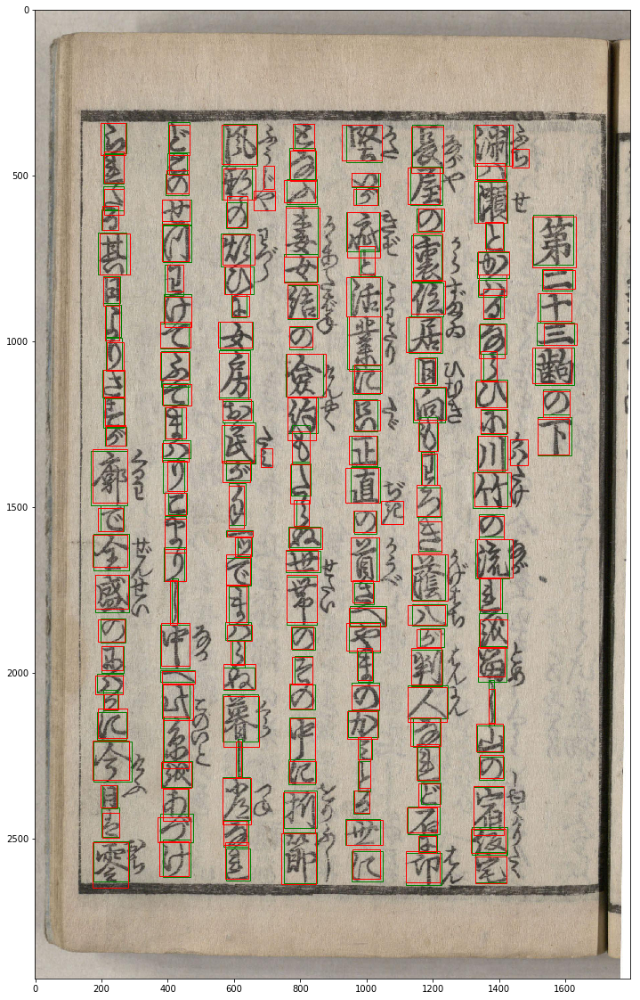

Full F1:  {'tp': 168, 'fp': 11, 'fn': 5} 8
Location only:  {'tp': 173, 'fp': 6, 'fn': 0}


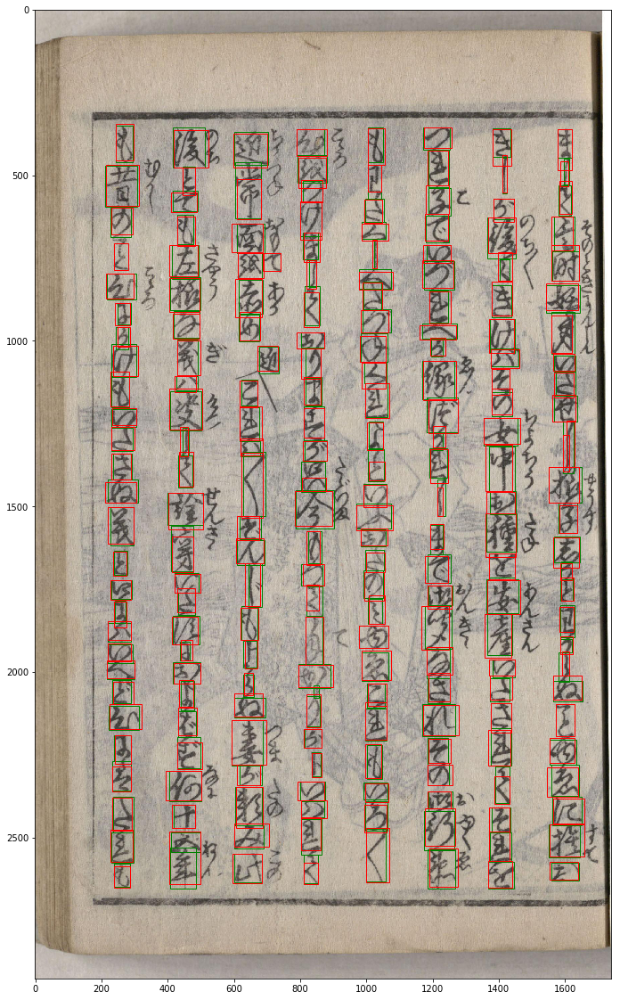

Full F1:  {'tp': 194, 'fp': 13, 'fn': 11} 9
Location only:  {'tp': 202, 'fp': 5, 'fn': 3}


In [38]:
import time
import cv2
final_pred = False
if(final_pred):
    plot_true = False
    plot_pred = False
    calc_score = False
    only_wh = False
    data_gen = image_generator(2,'full',resize_setting,'hmap',False)
    st_time = time.time()
    im_names_f = []
    sstr_labels = []
    total_sub_files = len(pred_filenames)
    sub_files_left = total_sub_files - sub_start
    im_dir = '../input/kuzushiji-recognition/test_images/'
else:
    plot_true = True
    plot_pred = True
    calc_score = True
    only_wh = False
    data_gen = image_generator(1,'full',resize_setting,'hmap',False)
    st_time = time.time()
    im_names_f = []
    sstr_labels = []
    tstr_labels = []
    #sub_files_left = len(test_list)
    sub_files_left = 10
    im_dir = '../input/kuzushiji-recognition/train_images/'
for inum in range(sub_files_left):
    t_im, b_im, im_shape, im_name = next(data_gen)
    #print('Time taken until image generation: ', time.time()-st_time)
    p_im = model_centre.predict(t_im, batch_size=4)
    #print('Time taken until prediction: ', time.time()-st_time)
    full_im_batch_size = t_im.shape[0]
    im_recon = np.array(Image.open(im_dir+im_name+'.jpg'))/255.
    ims0 = im_recon.shape[0]
    ims1 = im_recon.shape[1]
    if(only_wh):
        if(not(is_white_image(im_recon))):
            continue
    #if(is_white_image(im_recon)):
    #    prd_thresh = 0.2
    #else:
    prd_thresh = 0.2
    
    start_x = 0
    start_y = 0
    true_boxes = []
    pred_boxes = []

    nms_time_counter = 0.0
    translate_counter = 0.0
    final_nms_counter = 0.0
    
    #Nullify centers at the edges
    if(resize_setting):
        b_im[:,:25,:,0] = 0.
        b_im[:,:,:25,0] = 0.
        b_im[:,225:,:,0] = 0.
        b_im[:,:,225:,0] = 0.
        p_im[:,:25,:,0] = 0.
        p_im[:,:,:25,0] = 0.
        p_im[:,225:,:,0] = 0.
        p_im[:,:,225:,0] = 0.
    else:
        b_im[:,:50,:,0] = 0.
        b_im[:,:,:50,0] = 0.
        b_im[:,450:,:,0] = 0.
        b_im[:,:,450:,0] = 0.
        p_im[:,:50,:,0] = 0.
        p_im[:,:,:50,0] = 0.
        p_im[:,450:,:,0] = 0.
        p_im[:,:,450:,0] = 0.
    
    for i in range(full_im_batch_size):
        if(plot_true):
            p_to_b = predict_to_box(1.0,0.5)
            
            
            nms_rects = p_to_b.return_nms_rects(b_im[i])

            true_num = len(nms_rects)
            for j in range(len(nms_rects)):
                x_left,y_top,pw,ph,pscore = nms_rects[j]
                if(resize_setting):
                    x_left = int(x_left*2)
                    y_top = int(y_top*2)
                    pw = int(pw*2)
                    ph = int(ph*2)
                y_top = int(y_top+start_x)
                x_left = int(x_left+start_y)
                true_boxes.append((x_left,y_top,pw,ph,pscore))

        time_s = time.time()
        p_to_b = predict_to_box(prd_thresh,0.5)
        #Nullify centers at the edges
        nms_rects = p_to_b.return_nms_rects(p_im[i])
        time_en = time.time()
        nms_time_counter += (time_en-time_s)
        pred_num = len(nms_rects)
        time_s = time.time()
        for j in range(len(nms_rects)):
            x_left,y_top,pw,ph,pscore = nms_rects[j]
            if(resize_setting):
                x_left = int(x_left*2)
                y_top = int(y_top*2)
                pw = int(pw*2)
                ph = int(ph*2)
            y_top = int(y_top+start_x)
            x_left = int(x_left+start_y)
            pred_boxes.append((x_left,y_top,pw,ph,pscore))
        time_en = time.time()
        translate_counter += (time_en-time_s)
        start_x += stride
        if(start_x>=im_shape[1]-stride-1):
            start_x = 0
            start_y += stride

        #print(i,true_num,pred_num)

    if(plot_pred):
        fig,ax = plt.subplots(1,figsize=(30,20))
        ax.imshow(im_recon)

    if(plot_true):
        p_to_b = predict_to_box(0.2,0.5)
        true_boxes = p_to_b.nms_algo(true_boxes)
        for box in true_boxes:
            x_left,y_top,pw,ph = box[:4]
            rect = patches.Rectangle((int(y_top),int(x_left)),pw,ph,linewidth=1,edgecolor='g',facecolor='none')
            ax.add_patch(rect)

        #print('Num true boxes: ',len(true_boxes))
    if(calc_score):
        tstr_labels.append(box_list_dict[im_name])
    time_s = time.time()
    p_to_b = predict_to_box(prd_thresh,0.5)
    pred_boxes = p_to_b.nms_algo(pred_boxes)
    pred_boxes = p_to_b.nms_algo(pred_boxes,stage=2)
    time_en = time.time()
    #print('Time taken for nms_counter: ',nms_time_counter)
    #print('Time taken for translate counter: ',translate_counter)
    #print('Time taken for final_nms_counter: ',time_en-time_s)
    
    ens_len = 1
    class_preds = np.zeros([ens_len,len(pred_boxes),class_num])
    for en in range(ens_len):
        stage_2_input = np.zeros([len(pred_boxes),s2_input_width,s2_input_height,1])

        for nb, box in enumerate(pred_boxes):
            x_left,y_top,pw,ph = box[:4]
            x_c = int(x_left + ph/2)
            y_c = int(y_top + pw/2)
            
            if(plot_pred):
                rect = patches.Rectangle((int(y_top),int(x_left)),pw,ph,linewidth=1,edgecolor='r',facecolor='none')
                ax.add_patch(rect)
            pw = int(pw*(1.0+0.2*(np.random.uniform())))
            ph = int(ph*(1.0+0.2*(np.random.uniform())))
            x_left = max(0,min(int(x_c-ph/2),ims0))
            x_right = max(0,min(int(x_c+ph/2),ims0))
            y_top = max(0,min(int(y_c-pw/2),ims1))
            y_bot = max(0,min(int(y_c+pw/2),ims1))
            if(pw>=s2_input_width or ph>=s2_input_height):
                ptch_im = resize(im_recon[x_left:x_right,y_top:y_bot,:],(s2_input_height, s2_input_width))
                ptch_im = np.array(ptch_im*255,dtype=np.uint8)
                stage_2_input[nb,:,:,0] = preprocess(ptch_im)/255.
            else:
                ptch_im = np.array(im_recon[x_left:x_right,y_top:y_bot,:]*255,dtype=np.uint8)
                stage_2_input[nb,:,:,0] = preprocess(ptch_im)/255.

        
        #Predict stage_2
        time_s = time.time()
        class_preds_single = model.predict(stage_2_input,batch_size=16)
        if(stage_2_input.shape[0]>0):
            class_preds[en] = class_preds_single
        time_en = time.time()
        #print('Time taken for stage 2 prediction: ',time_en-time_s)

        #Populate the submission string:
    
    if(stage_2_input.shape[0]>0):
        sub_string = ''
        class_preds = np.max(class_preds,axis=0)
        class_preds = np.argmax(class_preds,axis=1)
        class_preds = [inv_char_dict[x] for x in class_preds]
        for nb, box in enumerate(pred_boxes):
            x_left,y_top,pw,ph = box[:4]
            char_pred = class_preds[nb]
            y_c = int(x_left + ph/2)
            x_c = int(y_top + pw/2)
            if(nb==0):
                sub_string += char_pred + ' ' + str(x_c) + ' ' + str(y_c)
            else:
                sub_string += ' ' + char_pred + ' ' + str(x_c) + ' ' + str(y_c)
    else:
        sub_string = ''
    im_names_f.append(im_name)
    sstr_labels.append(sub_string)
    #print('Num pred boxes: ',len(pred_boxes))
    #print('{} Image: {} Time taken: {}'.format(str(inum),im_name, str(time.time()-st_time)))
    if((time.time()-st_time)>31500.):
        print('Reached limit of session, Write and exit')
        print('Last file read: ',inum)
        break
        
    
    if(plot_pred):
        plt.show()
        plt.close()
    
    if(calc_score):
        print('Full F1: ',score_page(sub_string,box_list_dict[im_name]),inum)
        print('Location only: ',score_page_location_only(sub_string,box_list_dict[im_name]))
sub_dict = {'image_id': im_names_f, 'labels': sstr_labels}
sub_dict = pd.DataFrame.from_dict(sub_dict)
sub_dict.to_csv("submission.csv",index=False)

In [39]:
compute_mean_f1(sstr_labels,tstr_labels)

TP: 1701, FP: 162, FN: 208


0.9019088016967126

In [40]:
compute_mean_f1_location_only(sstr_labels,tstr_labels)

TP: 1830, FP: 33, FN: 79


0.9703075291622482

In [41]:
# im_dir = '../input/kuzushiji-recognition/train_images/'
# mean_list = []
# for nim,im in enumerate(input_filenames):
#     if(nim%100==0):
#         print(nim)
#     im_name = im.split('.jpg')[0]
#     im_name = Image.open(im_dir+im_name+'.jpg')
#     im_name = np.array(im_name)/255.
#     if(np.mean(im_name)>0.8):
#         plt.imshow(im_name)
#         plt.show()
#         plt.close()
#         plt.imshow(im_name[:,:,0],cmap='gray')
#         plt.show()
#         plt.close()
#         im_name = im.split('.jpg')[0]
#         im_name = Image.open(im_dir+im_name+'.jpg').convert('LA')
#         im_name = np.array(im_name)/255.
#         plt.imshow(im_name[:,:,0],cmap='gray')
#         plt.show()
#         plt.close()